# Assignment 2 - Image Correction

In [1]:
import cv2
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
from utils import equalize_hist, gamma_correction, correct_images, get_cdf, change_images_cdf, convert_images

In [2]:
images = []
data_src = Path("data")

for img in data_src.iterdir():
    images.append(cv2.imread(str(img)))

images = np.array(images)

In [3]:
print(images.shape)

(6, 1000, 1000, 3)


In [4]:
gray_images = convert_images(images, cv2.COLOR_BGR2GRAY)
rgb_images = convert_images(images, cv2.COLOR_BGR2RGB)
ycrcb_images = convert_images(images, cv2.COLOR_BGR2YCrCb)
hsv_images = convert_images(images, cv2.COLOR_BGR2HSV)
xyz_images = convert_images(images, cv2.COLOR_BGR2XYZ)
lab_images = convert_images(images, cv2.COLOR_BGR2LAB)

for arr in [gray_images, rgb_images, ycrcb_images, hsv_images, xyz_images, lab_images]:
    print(arr.shape)

(6, 1000, 1000)
(6, 1000, 1000, 3)
(6, 1000, 1000, 3)
(6, 1000, 1000, 3)
(6, 1000, 1000, 3)
(6, 1000, 1000, 3)


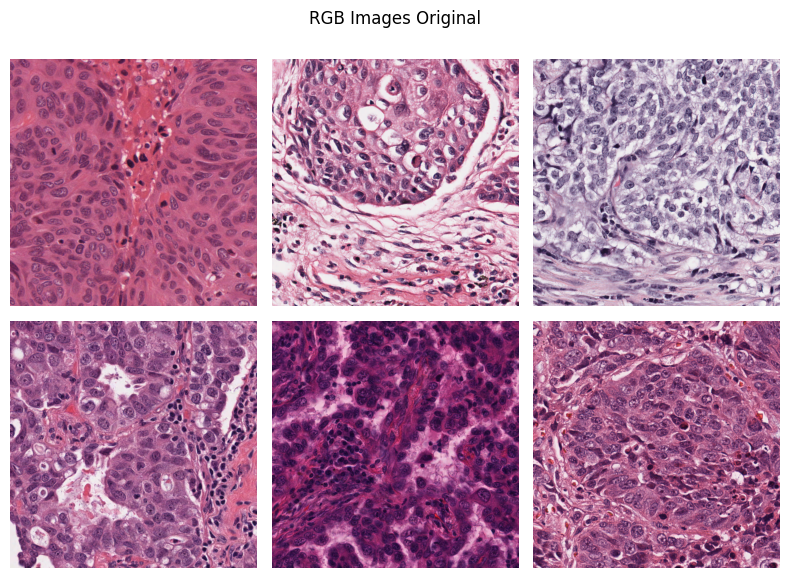

In [5]:
fig = plt.figure(figsize=(8, 6))
fig.suptitle("RGB Images Original")

rows = 2
columns = 3

for i, img in enumerate(rgb_images):
    fig.add_subplot(rows, columns, i+1)
    plt.axis('off')
    plt.imshow(img)

plt.tight_layout()
plt.show()

## Histogram Equalization & Gamma Correction

Ranges in OpenCV for 8 bit images:

- grayscale - [0,255]
- RGB - [0,255] for every channel
- YCrCb - [0,255] for every channel
- HSV - [0,180] for H and [0,255] for S and V
- XYZ - [0,255] for every channel
- Lab - [0,255] for every channel

source: https://docs.opencv.org/4.9.0/de/d25/imgproc_color_conversions.html

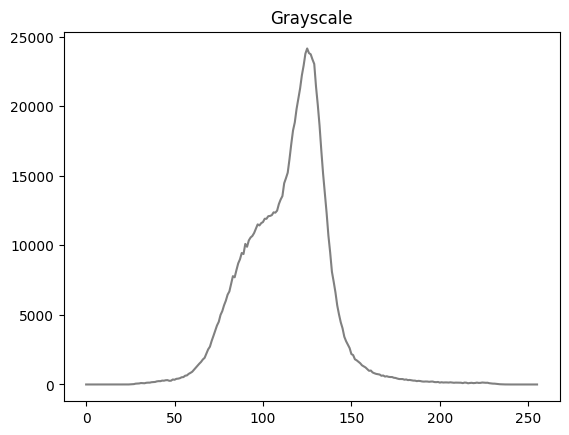

In [6]:
gray_hist = cv2.calcHist([gray_images[0]], [0], None, [256], [0, 255])
plt.plot(gray_hist, color="gray")
plt.title("Grayscale")
plt.show()

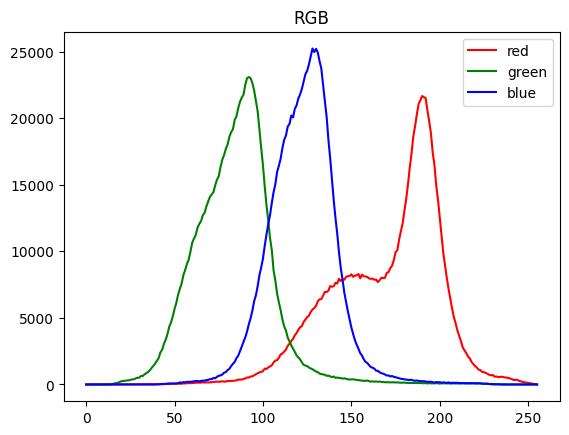

In [7]:
for i, color in enumerate(["red", "green", "blue"]):
    hist = cv2.calcHist([rgb_images[0]], [i], None, [256], [0, 255])
    plt.plot(hist, color=color, label=color)
plt.legend()
plt.title("RGB")
plt.show()

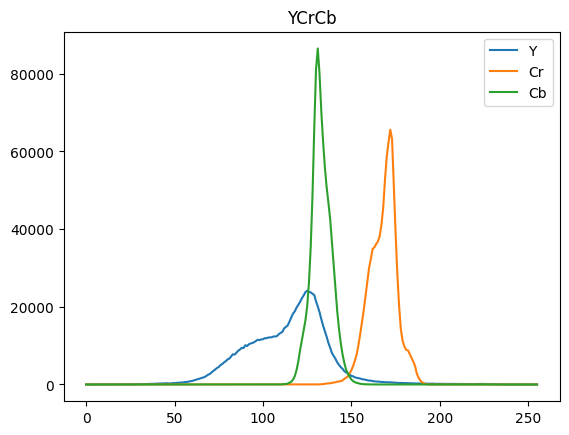

In [8]:
for i, label in enumerate(["Y", "Cr", "Cb"]):
    hist = cv2.calcHist([ycrcb_images[0]], [i], None, [256], [0, 255])
    plt.plot(hist, label=label)
plt.legend()
plt.title("YCrCb")
plt.show()

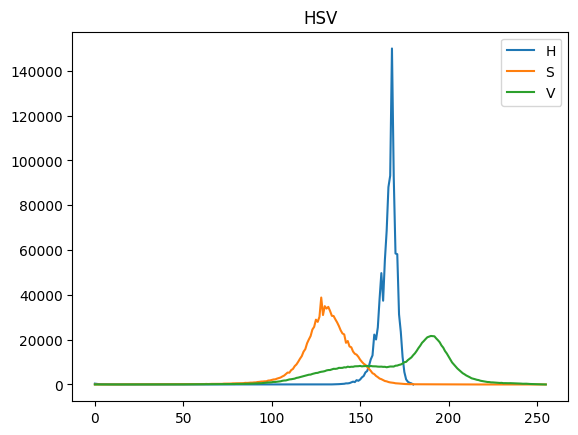

In [9]:
for i, (label, range_ch) in enumerate(zip(["H", "S", "V"], [[0, 180], [0, 255], [0, 255]])):
    hist = cv2.calcHist([hsv_images[0]], [i], None, [range_ch[1]+1], range_ch)
    plt.plot(hist, label=label)
plt.legend()
plt.title("HSV")
plt.show()

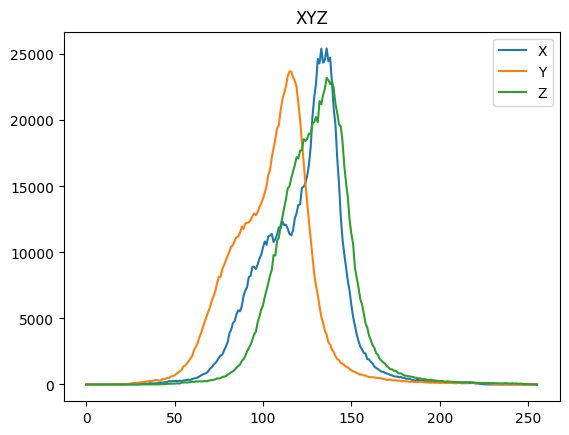

In [10]:
for i, label in enumerate(["X", "Y", "Z"]):
    hist = cv2.calcHist([xyz_images[0]], [i], None, [256], [0, 255])
    plt.plot(hist, label=label)
plt.legend()
plt.title("XYZ")
plt.show()

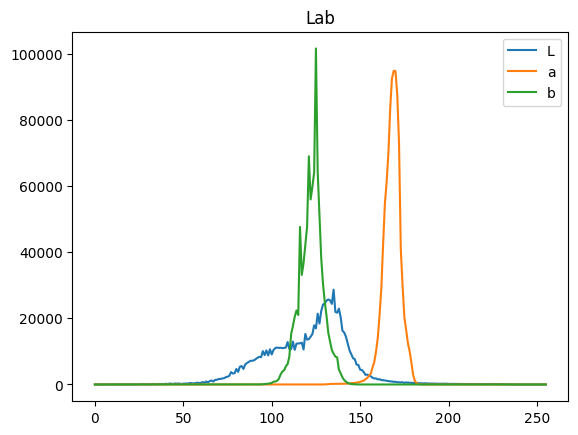

In [11]:
for i, label in enumerate(["L", "a", "b"]):
    hist = cv2.calcHist([lab_images[0]], [i], None, [256], [0, 255])
    plt.plot(hist, label=label)
plt.legend()
plt.title("Lab")
plt.show()

## Histogram equalization

### Grayscale

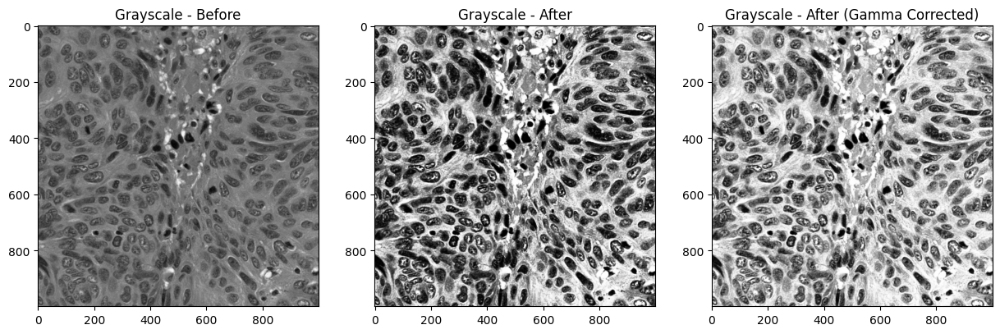

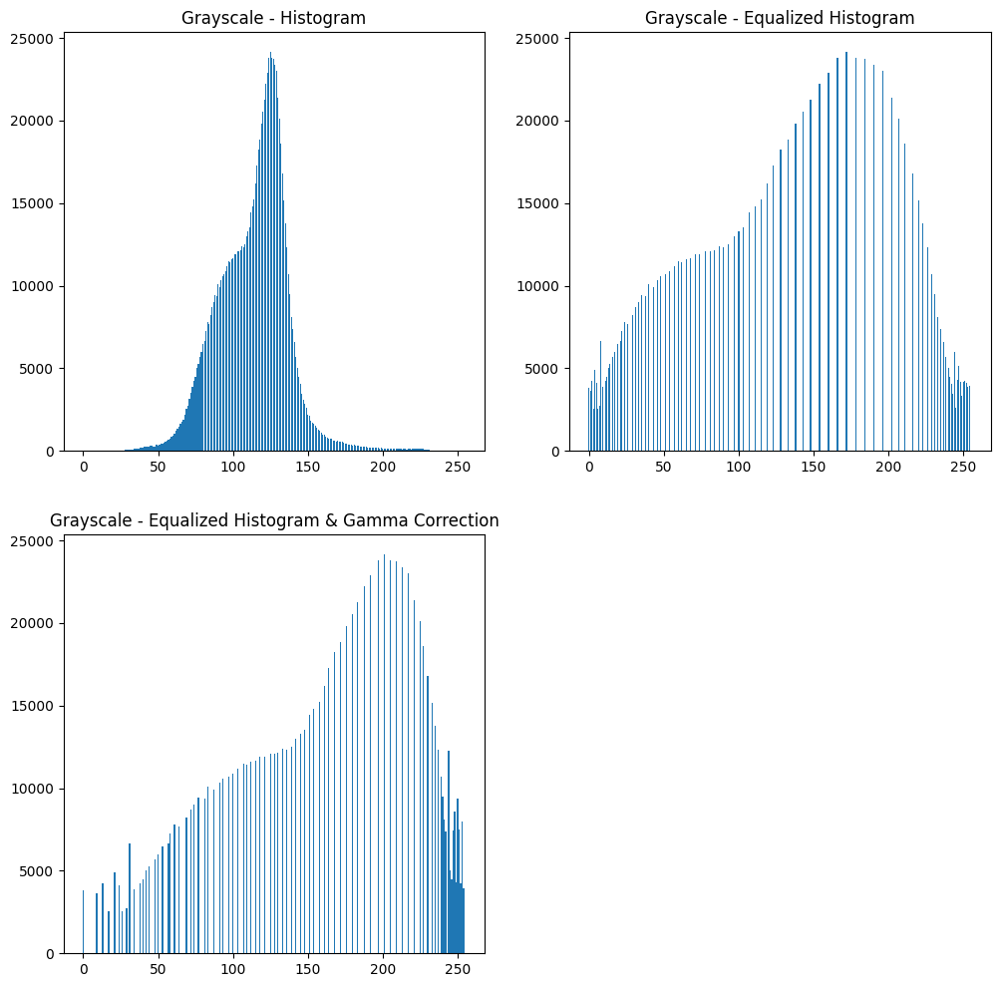

In [12]:
img = gray_images[0]
img_equalized = equalize_hist(img, 256)
img_eq_gamma_corrected = gamma_correction(img_equalized, 0.6, 255)

gray_hist_before = cv2.calcHist([img], [0], None, [256], [0, 255]).reshape((256,))
gray_hist_after = cv2.calcHist([img_equalized], [0], None, [256], [0, 255]).reshape((256,))
gray_hist_after_gamma = cv2.calcHist([img_eq_gamma_corrected], [0], None, [256], [0, 255]).reshape((256,))

fig = plt.figure(figsize=(15, 45))

rows = 1
columns = 3

fig.add_subplot(rows, columns, 1)
plt.title("Grayscale - Before")
plt.imshow(img, cmap="gray")

fig.add_subplot(rows, columns, 2)
plt.title("Grayscale - After")
plt.imshow(img_equalized, cmap="gray")

fig.add_subplot(rows, columns, 3)
plt.title("Grayscale - After (Gamma Corrected)")
plt.imshow(img_eq_gamma_corrected, cmap="gray")

plt.show()

rows = 2
columns = 2

fig = plt.figure(figsize=(12, 12))
x = np.arange(256)

fig.add_subplot(rows, columns, 1)
plt.title("Grayscale - Histogram")
plt.bar(x, gray_hist_before)

fig.add_subplot(rows, columns, 2)
plt.title("Grayscale - Equalized Histogram")
plt.bar(x, gray_hist_after)

fig.add_subplot(rows, columns, 3)
plt.title("Grayscale - Equalized Histogram & Gamma Correction")
plt.bar(x, gray_hist_after_gamma)

plt.show()

### RGB

In [13]:
rgb_images_eq, rgb_images_eq_gamma = correct_images(rgb_images, 0.6, [255, 255, 255])

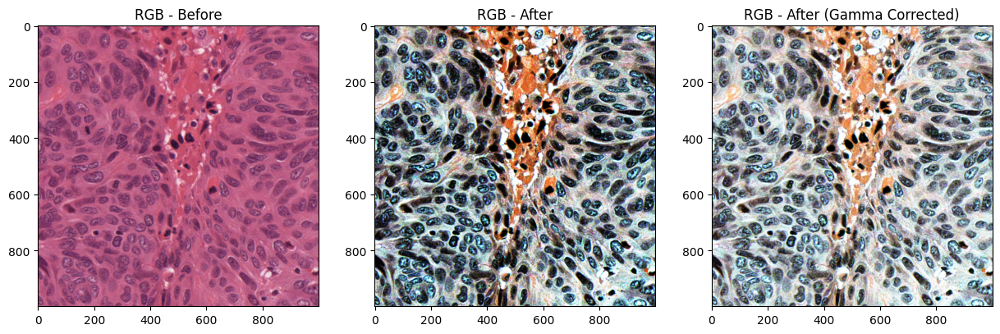

In [14]:
fig = plt.figure(figsize=(15, 45))

rows = 1
columns = 3

fig.add_subplot(rows, columns, 1)
plt.title("RGB - Before")
plt.imshow(rgb_images[0])

fig.add_subplot(rows, columns, 2)
plt.title("RGB - After")
plt.imshow(rgb_images_eq[0])

fig.add_subplot(rows, columns, 3)
plt.title("RGB - After (Gamma Corrected)")
plt.imshow(rgb_images_eq_gamma[0])

plt.show()

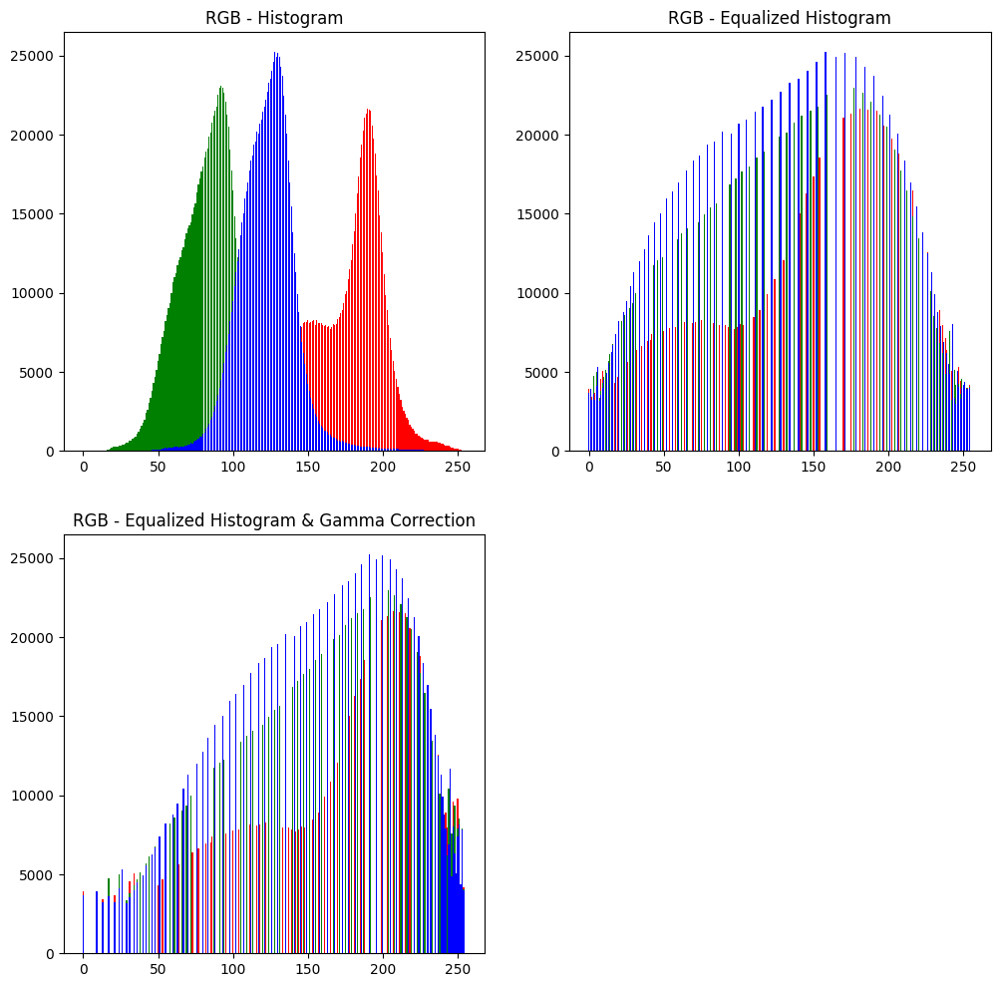

In [15]:
fig = plt.figure(figsize=(12, 12))

rows = 2
columns = 2

stage = ["RGB - Histogram", "RGB - Equalized Histogram", "RGB - Equalized Histogram & Gamma Correction"]

for i, current_img in enumerate([rgb_images[0], rgb_images_eq[0], rgb_images_eq_gamma[0]]):
    fig.add_subplot(rows, columns, i + 1)
    for j, color in enumerate(["red", "green", "blue"]):
        hist = cv2.calcHist([current_img], [j], None, [256], [0, 255]).reshape((256,))
        plt.bar(x, hist, color=color, label=color)
    plt.title(stage[i])

plt.show()

### RGB - original images vs. corrected images

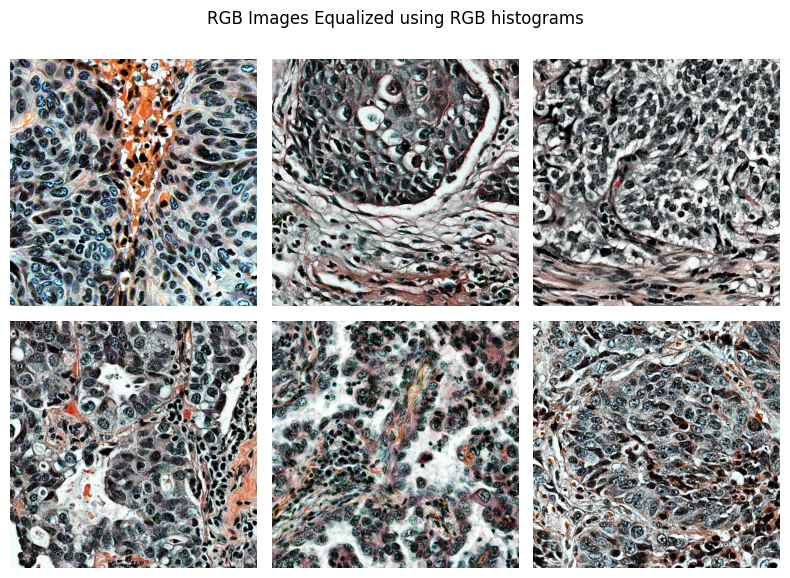

In [16]:
fig = plt.figure(figsize=(8, 6))
fig.suptitle("RGB Images Equalized using RGB histograms")

rows = 2
columns = 3

for i, img in enumerate(rgb_images_eq):
    fig.add_subplot(rows, columns, i+1)
    plt.axis('off')
    plt.imshow(img)

plt.tight_layout()
plt.show()

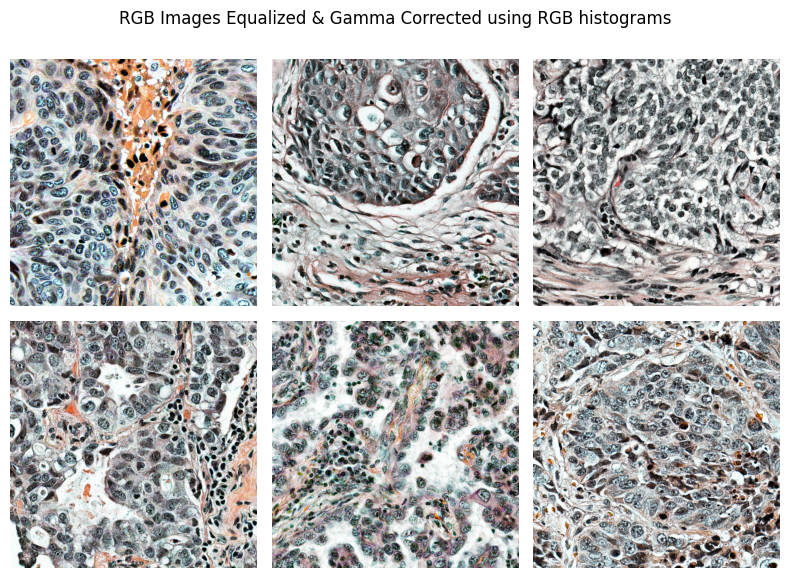

In [17]:
fig = plt.figure(figsize=(8, 6))
fig.suptitle("RGB Images Equalized & Gamma Corrected using RGB histograms")

for i, img in enumerate(rgb_images_eq_gamma):
    fig.add_subplot(rows, columns, i+1)
    plt.axis('off')
    plt.imshow(img)

plt.tight_layout()
plt.show()

### YCrCb

In [18]:
ycrcb_images_eq, ycrcb_images_eq_gamma = correct_images(ycrcb_images, 0.6, [255, 255, 255])

In [19]:
ycrcb_eq_to_rgb = []
ycrcb_eq_gamma_to_rgb = []

for img1, img2 in zip(ycrcb_images_eq, ycrcb_images_eq_gamma):
    ycrcb_eq_to_rgb.append(cv2.cvtColor(img1, cv2.COLOR_YCrCb2RGB))
    ycrcb_eq_gamma_to_rgb.append(cv2.cvtColor(img2, cv2.COLOR_YCrCb2RGB))

### HSV

In [20]:
hsv_images_eq, hsv_images_eq_gamma = correct_images(hsv_images, 0.6, [180, 255, 255])

In [21]:
hsv_eq_to_rgb = []
hsv_eq_gamma_to_rgb = []

for img1, img2 in zip(hsv_images_eq, hsv_images_eq_gamma):
    hsv_eq_to_rgb.append(cv2.cvtColor(img1, cv2.COLOR_HSV2RGB))
    hsv_eq_gamma_to_rgb.append(cv2.cvtColor(img2, cv2.COLOR_HSV2RGB))

### XYZ

In [22]:
xyz_images_eq, xyz_images_eq_gamma = correct_images(xyz_images, 0.6, [255, 255, 255])

In [23]:
xyz_eq_to_rgb = []
xyz_eq_gamma_to_rgb = []

for img1, img2 in zip(xyz_images_eq, xyz_images_eq_gamma):
    xyz_eq_to_rgb.append(cv2.cvtColor(img1, cv2.COLOR_XYZ2RGB))
    xyz_eq_gamma_to_rgb.append(cv2.cvtColor(img2, cv2.COLOR_XYZ2RGB))

### Lab

In [24]:
lab_images_eq, lab_images_eq_gamma = correct_images(lab_images, 0.6, [255, 255, 255])

In [25]:
lab_eq_to_rgb = []
lab_eq_gamma_to_rgb = []

for img1, img2 in zip(lab_images_eq, lab_images_eq_gamma):
    lab_eq_to_rgb.append(cv2.cvtColor(img1, cv2.COLOR_Lab2RGB))
    lab_eq_gamma_to_rgb.append(cv2.cvtColor(img2, cv2.COLOR_Lab2RGB))

### Comparison

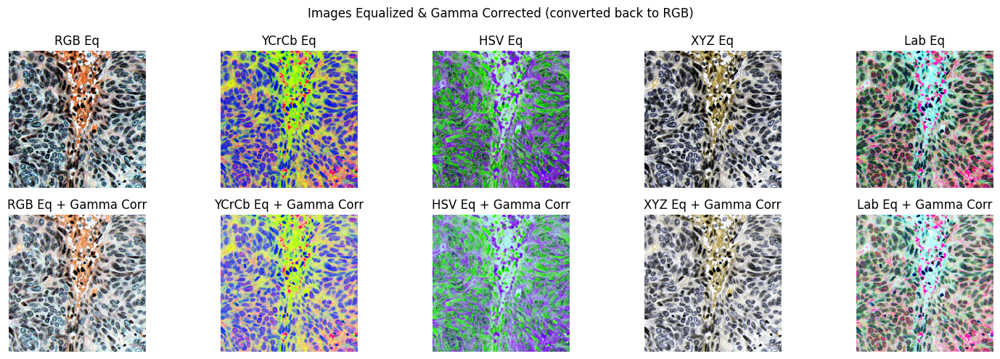

In [26]:
fig = plt.figure(figsize=(15,5))
fig.suptitle("Images Equalized & Gamma Corrected (converted back to RGB)")

rows = 2
columns = 5

images = [
    rgb_images_eq[0],
    ycrcb_images_eq[0],
    hsv_images_eq[0],
    xyz_images_eq[0],
    lab_images_eq[0],
    rgb_images_eq_gamma[0],
    ycrcb_images_eq_gamma[0],
    hsv_images_eq_gamma[0],
    xyz_images_eq_gamma[0],
    lab_images_eq_gamma[0]
]

titles = [
    "RGB Eq", "YCrCb Eq", "HSV Eq", "XYZ Eq", "Lab Eq",
    "RGB Eq + Gamma Corr", "YCrCb Eq + Gamma Corr", "HSV Eq + Gamma Corr", "XYZ Eq + Gamma Corr", "Lab Eq + Gamma Corr"
]

for i, (img, title) in enumerate(zip(images, titles)): 
    fig.add_subplot(rows, columns, i + 1)
    plt.axis('off')
    plt.title(title)
    plt.imshow(img)

plt.tight_layout()
plt.show()

## Color correction using eCDF

### RGB

In [27]:
target = rgb_images[0]

split_target = cv2.split(target)

target_cdf_r = get_cdf(split_target[0])
target_cdf_g = get_cdf(split_target[1])
target_cdf_b = get_cdf(split_target[2])

In [28]:
cdf_corrected_rgb_images = change_images_cdf(rgb_images, [target_cdf_r, target_cdf_g, target_cdf_b])

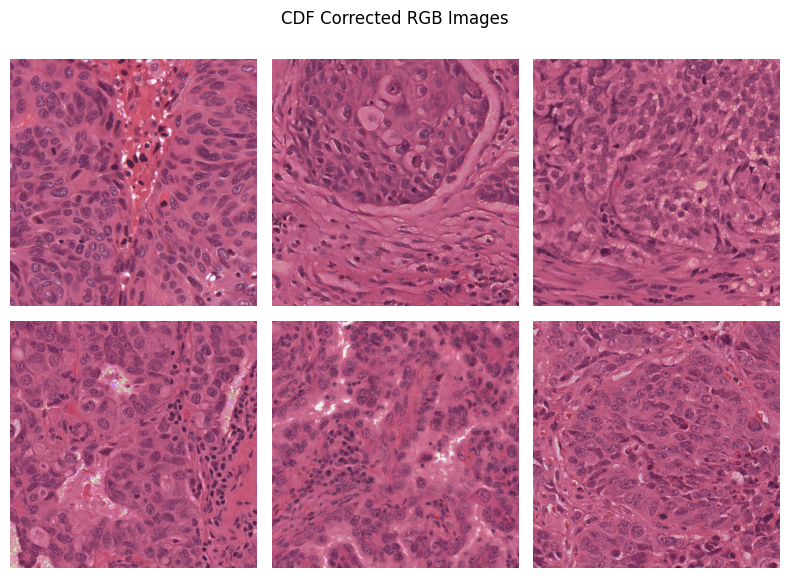

In [29]:
fig = plt.figure(figsize=(8, 6))
fig.suptitle("CDF Corrected RGB Images")

rows = 2
columns = 3

for i, img in enumerate(cdf_corrected_rgb_images):
    fig.add_subplot(rows, columns, i+1)
    plt.axis('off')
    plt.imshow(img)

plt.tight_layout()
plt.show()

### YCrCb

In [30]:
target = ycrcb_images[0]

split_target = cv2.split(target)

target_cdf_y = get_cdf(split_target[0])
target_cdf_cr = get_cdf(split_target[1])
target_cdf_cb = get_cdf(split_target[2])

In [31]:
cdf_corrected_ycrcb_images = change_images_cdf(ycrcb_images, [target_cdf_y, target_cdf_cr, target_cdf_cb])

In [32]:
ycrcb_to_rgb_images = []

for img in cdf_corrected_ycrcb_images:
    ycrcb_to_rgb_images.append(cv2.cvtColor(img, cv2.COLOR_YCrCb2RGB))

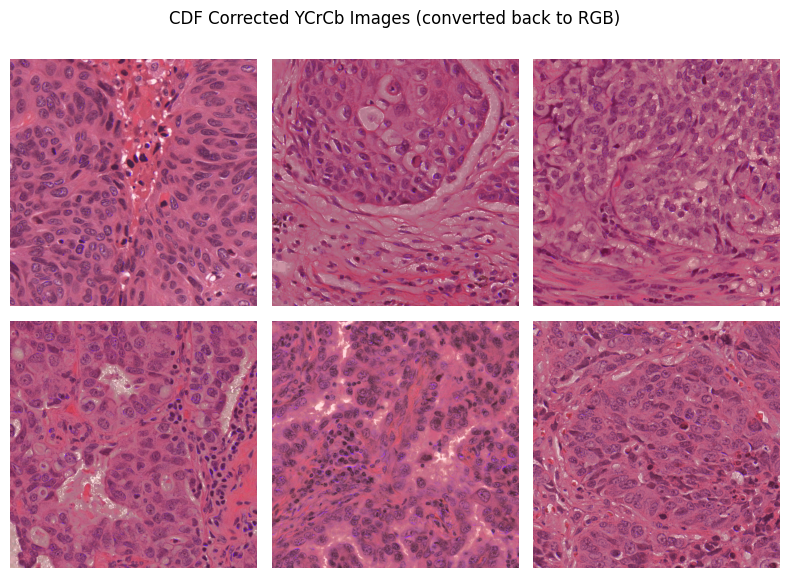

In [33]:
fig = plt.figure(figsize=(8, 6))
fig.suptitle("CDF Corrected YCrCb Images (converted back to RGB)")

rows = 2
columns = 3

for i, img in enumerate(ycrcb_to_rgb_images):
    fig.add_subplot(rows, columns, i+1)
    plt.axis('off')
    plt.imshow(img)

plt.tight_layout()
plt.show()